# Post Test set

In [1]:
import numpy as np
import glob
import os
import matplotlib.pyplot as plt

In [2]:
import pandas as pd
df = pd.DataFrame()
df_2 = pd.DataFrame()

## Test Metrics

### Original volume

#### First Eigen Component percentage

In [3]:
from scripts.utils import *
orig_path = 'data/MOLLI_post_dataset/test'
orig_pca_changes = []
for file in sorted(glob.glob(os.path.join(orig_path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    orig_pca_changes.append(org_dis)
print(f"Mean of original PCA is {np.mean(np.array(orig_pca_changes))}")

Mean of original PCA is 0.8079221272634383


#### T1 fitting

In [4]:
import scipy.io
from pathlib import Path
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import ndimage

title_font_size=8
title_pad = 10
VMAX = 250

TVMAX = 2500

def mae(a, b):
    return np.absolute(np.subtract(a, b)).mean()


def plot_t1_changes(path, size=(20, 50)):
    fig = plt.figure(figsize=size)
    t1err_square_list = []
    t1err_heart_list = []
    t1err_myo_list = []
    subject_list = []
    sd_square_list = []
    sd_heart_list = []
    sd_myo_list = []
    avgt1s = []
    
    neighbor = ndimage.generate_binary_structure(2, 2)
    for i, file in enumerate(sorted(glob.glob(os.path.join(path, '*.mat')))):
        subject = Path(file).stem
        subject_list.append(subject)
        fd = scipy.io.loadmat(file)

        SD_err = np.real(fd['sd_mse'])

        epi = fd['epi_BW']
        endo = fd['endo_BW']

        heartmask = ndimage.binary_dilation(epi, structure=neighbor, iterations=1).astype(epi.dtype)

        itemindex = np.where(heartmask == 1)
        x1, x2 = max(itemindex[0][0]-20,0), min(itemindex[0][-1]+20, 111)
        y1, y2 = max(itemindex[1][0]-40,0), min(itemindex[1][-1]+40, 111)
        # print(subject, x1, x2, y1, y2)
        areamask = np.zeros_like(heartmask)
        areamask[x1:x2, y1:y2] = 1
        myomask = heartmask - endo
        
        errmap = SD_err * areamask
        square_SD_err = np.mean(errmap[areamask==1])
        t1err_square_list.append(square_SD_err)
        
        fig.add_subplot(20, 6, 1+i*6)
        ax = plt.gca()
        im = ax.imshow(errmap, cmap='jet', vmin=0, vmax=VMAX)
        ax.axis('off')
        ax.set_title(f"Average SD error {(square_SD_err):.4f}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        t1_params_pre = fd['pmap_mse']
        a = t1_params_pre[:, :, 0]
        b = t1_params_pre[:, :, 1]
        c = t1_params_pre[:, :, 2]
        t1map = c * (b - 1)
        t1map[t1map<0] = 0
        t1map[t1map>TVMAX] = TVMAX
        sd_square_list.append(t1map*areamask)

        fig.add_subplot(20, 6, 2+i*6)
        ax = plt.gca()
        im = ax.imshow(t1map, cmap='jet', vmin=0, vmax=TVMAX)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        hearterrmap = SD_err * heartmask
        heartt1map = t1map * heartmask
        heart_SD_err = np.mean(hearterrmap[heartmask==1])
        t1err_heart_list.append(heart_SD_err)
        sd_heart_list.append(heartt1map)

        fig.add_subplot(20, 6, 3+i*6)
        ax = plt.gca()
        im = ax.imshow(hearterrmap, cmap='jet', vmin=0, vmax=VMAX)
        ax.axis('off')
        ax.set_title(f"Average SD error {(heart_SD_err):.4f} in ROI", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(20, 6, 4+i*6)
        ax = plt.gca()
        im = ax.imshow(heartt1map, cmap='jet', vmin=0, vmax=TVMAX)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        myoerrmap = SD_err * myomask
        myot1map = t1map * myomask
        myo_SD_err = np.mean(myoerrmap[myomask==1])
        sd_myo_list.append(myot1map)
        t1err_myo_list.append(myo_SD_err)
        avgt1 = np.mean(heartt1map[heartmask==1])
        avgt1s.append(avgt1)

        fig.add_subplot(20, 6, 5+i*6)
        ax = plt.gca()
        im = ax.imshow(myoerrmap, cmap='jet', vmin=0, vmax=VMAX)
        ax.axis('off')
        ax.set_title(f"Average SD error {(myo_SD_err):.4f} in Myocardium", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(20, 6, 6+i*6)
        ax = plt.gca()
        im = ax.imshow(myot1map, cmap='jet', vmin=0, vmax=TVMAX)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    plt.subplots_adjust(left=0.0001,right=0.9, top=0.95, bottom=0.1,)
    return fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s

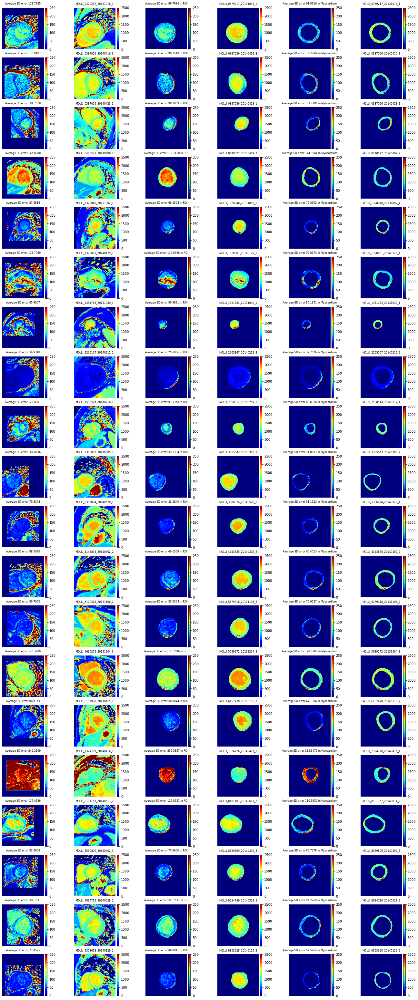

In [5]:
path = "data/MOLLI_pre_dataset/T1_SDerr"

fig, subject_list, orig_t1err_square_list, orig_t1err_heart_list, orig_t1err_myo_list, orig_sd_square_list, orig_sd_heart_list, orig_sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"data/MOLLI_pre_dataset/T1_SDerr/orig_t1err.png", dpi=300)

df['Cases'] = subject_list
df['Raw Square T1err'] = orig_t1err_square_list
df['Raw ROI T1err'] = orig_t1err_heart_list
df['Raw Myo T1err'] = orig_t1err_myo_list
df_2['Cases'] = subject_list
df_2['Raw PCA'] = orig_pca_changes

df['Raw ROI T1'] = avgt1s

### Round 1

In [6]:
import voxelmorph_group as vxm  # nopep8
import numpy as np
import glob
import os
jacobian = vxm.losses.Jacobian().loss

In [7]:
r = 1
root = f"results/MOLLI_pre/Group/rank_5_5_5_5_5_5_5/nmi/smooth/image_loss_weight1/cycle_loss_weight0.01/weight0.001/bspline/cps4_svfsteps7_svfscale1/e100/test_MOLLI_pre"
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [8]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 1 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 1 PCA is 0.7123240126460348 and std is 0.04037472709229717


#### Jacobian Determination

In [9]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0035062741953879595


#### T1 fitting

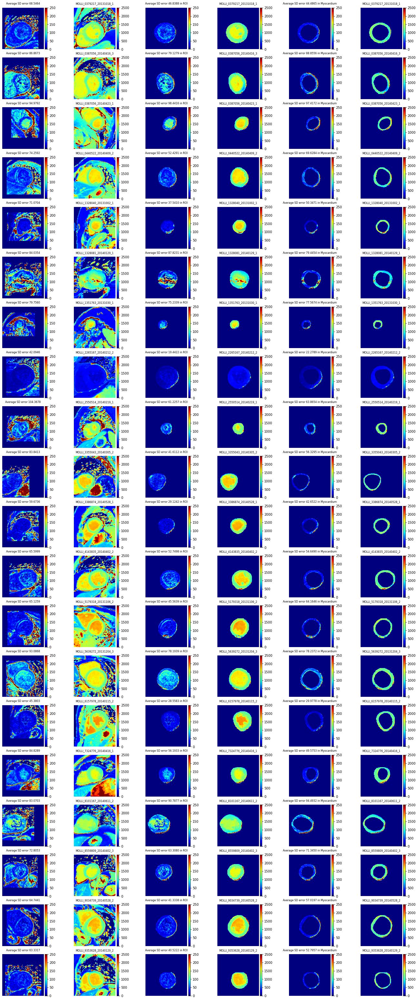

In [10]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 2

In [11]:
r = 2
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [12]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.7177267998826696 and std is 0.039756467342905784


#### Jacobian Determination

In [13]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0034316752571612597


#### T1 fitting

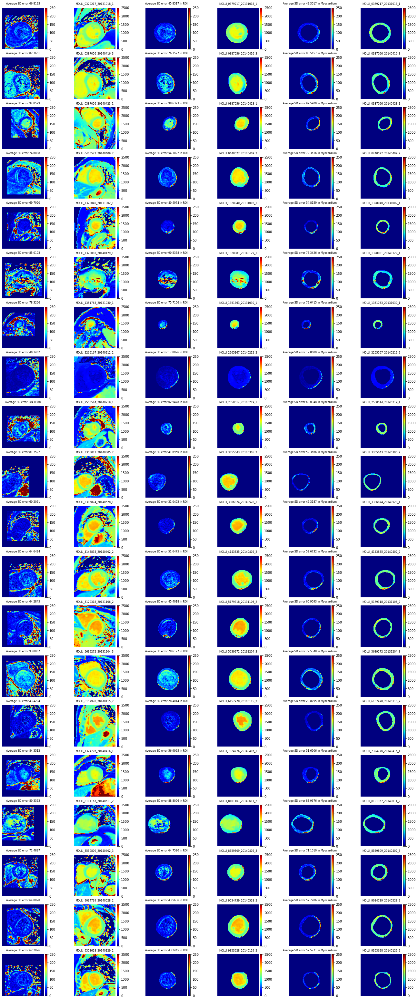

In [14]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 3

In [15]:
r = 3
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [16]:
path = f"{base_path}/moved"
r5_pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    r5_pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(r5_pca_changes))} and std is {np.std(np.array(r5_pca_changes))}")

Mean of Round 2 PCA is 0.7213392420846356 and std is 0.03902505899004396


#### Jacobian Determination

In [17]:
r5_folding_ratio_list = []
r5_mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    r5_folding_ratio_list.append(folding_ratio)
    r5_mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(r5_folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(r5_mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.003947085235267878


#### T1 fitting

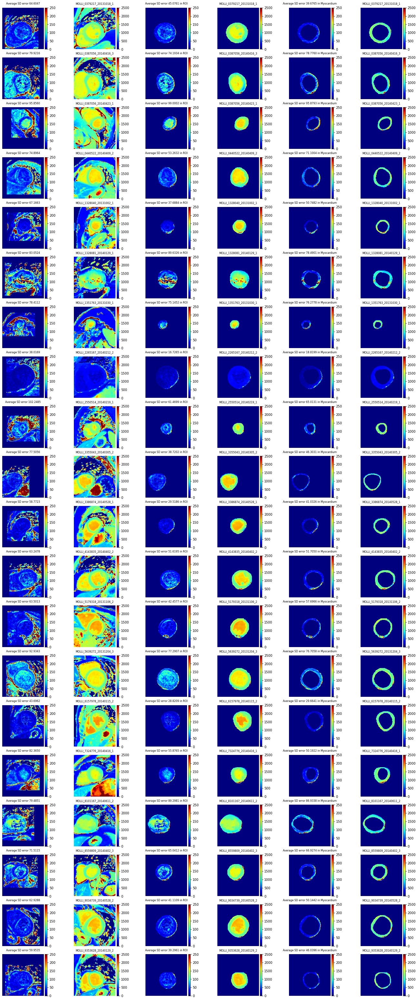

In [18]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 4

In [19]:
r = 4
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [20]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.7239212619889888 and std is 0.03865339856002619


#### Jacobian Determination

In [21]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.004223013296723366


#### T1 fitting

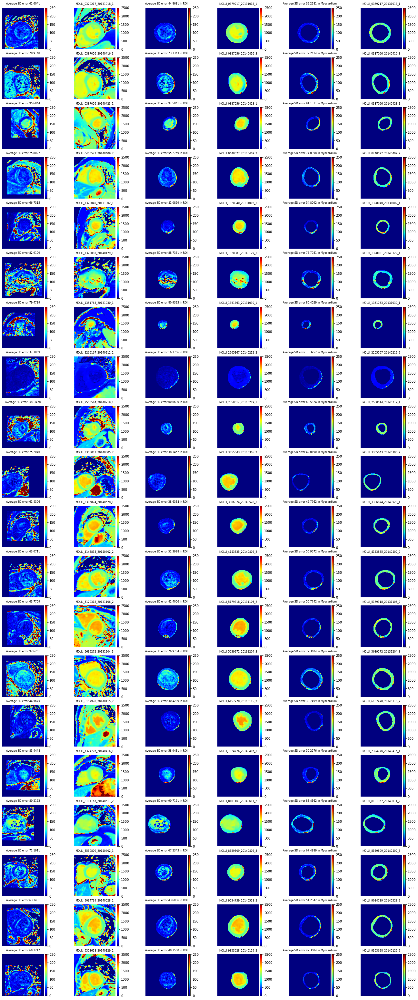

In [22]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 5

In [23]:
r = 5
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [24]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.7261905662399897 and std is 0.03840823997601453


#### Jacobian Determination

In [25]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.004383935127407312


#### T1 fitting

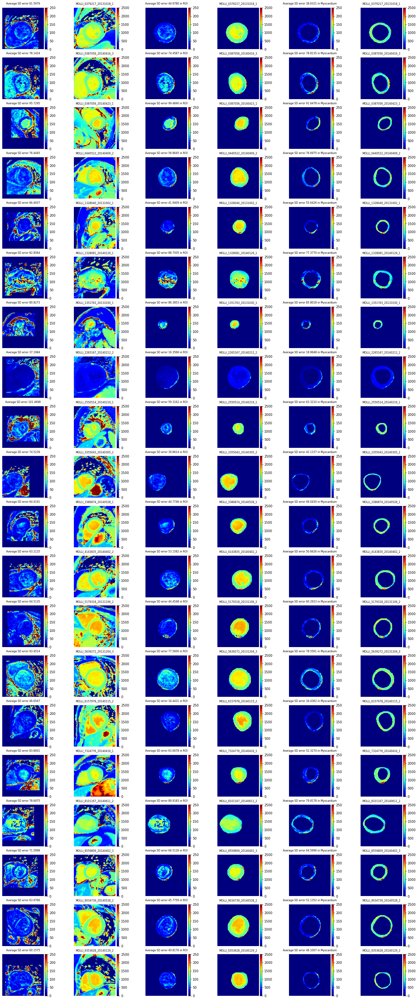

In [26]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 6

In [27]:
r = 6
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [28]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.7278342524323891 and std is 0.038285356125471376


#### Jacobian Determination

In [29]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.004991907626390457


#### T1 fitting

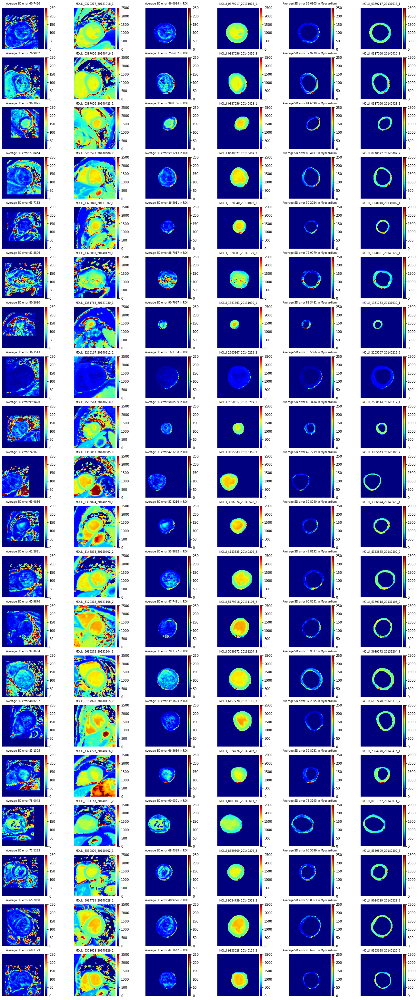

In [30]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 7

In [31]:
r = 7
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [32]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.7295737445077632 and std is 0.03836750460970156


#### Jacobian Determination

In [33]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.005295165814459324


#### T1 fitting

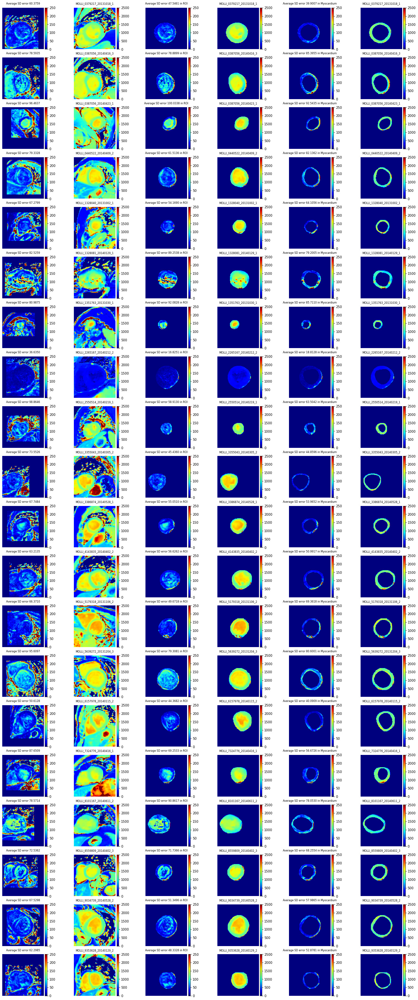

In [34]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Summary

In [35]:
df
df.to_csv(f"{root}/summary.csv")

In [36]:
df_ROI_desc = pd.DataFrame()
df_ROI_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_ROI_desc[f'R{round}/Raw ROI %'] = (df['Raw ROI T1err'] - df[f'R{round} ROI T1err']) / df['Raw ROI T1err']
df_ROI_desc.describe()

,R1/Raw ROI %,R2/Raw ROI %,R3/Raw ROI %,R4/Raw ROI %,R5/Raw ROI %,R6/Raw ROI %,R7/Raw ROI %
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.326206,0.320604,0.340179,0.319660,0.297340,0.264374,0.228034
std,0.201780,0.201176,0.197233,0.204249,0.215721,0.234529,0.250186
min,-0.001482,-0.003473,-0.007165,0.008055,-0.058903,-0.213738,-0.301936
25%,0.177651,0.178504,0.209421,0.175060,0.166608,0.124705,0.087594
50%,0.288047,0.295185,0.313708,0.310619,0.299486,0.256070,0.202092
75%,0.430702,0.422365,0.429263,0.402067,0.381922,0.382087,0.368608
max,0.762279,0.758882,0.763620,0.750647,0.733197,0.719253,0.707030


In [37]:
# tmp = df_ROI_desc.describe()
# tmpT = tmp.T
# error = tmpT['std']
# y_mean = tmpT['mean']
# lower = y_mean - error
# upper = y_mean + error

# # Draw plot with error band and extra formatting to match seaborn style
# fig, ax = plt.subplots(figsize=(9,5))
# x = np.arange(1, 8)
# # ax.plot(x, y_mean, label='ROI')
# # ax.plot(x, lower, color='tab:blue', alpha=0.1)
# # ax.plot(x, upper, color='tab:blue', alpha=0.1)
# # ax.fill_between(x, lower, upper, alpha=0.2)
# # ax.set_xlabel('timepoint')
# # ax.set_ylabel('signal')
# # ax.spines['top'].set_visible(False)
# # ax.spines['right'].set_visible(False)

# tmp = df_Myo_desc.describe()
# tmpT = tmp.T
# error = tmpT['std']
# y_mean = tmpT['mean']
# lower = y_mean - error
# upper = y_mean + error

# # Draw plot with error band and extra formatting to match seaborn style
# x = np.arange(1, 8)
# ax.plot(x, y_mean, label='Myo', color='tab:orange')
# ax.plot(x, lower, color='tab:orange', alpha=0.1)
# ax.plot(x, upper, color='tab:orange', alpha=0.1)
# ax.fill_between(x, lower, upper, alpha=0.2)
# ax.set_xlabel('timepoint')
# ax.set_ylabel('signal')
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# plt.show()

In [38]:
y = [0.3326, 0.3378, 0.3346, 0.3355, 0.3245, 0.3154, 0.3219]

Text(0, 0.5, 'Myo + LV SD Difference (%)')

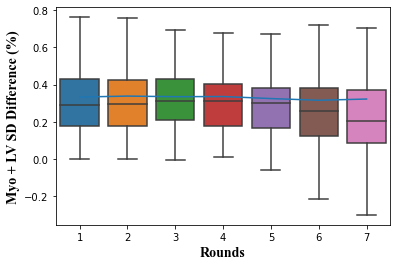

In [39]:
import seaborn as sns
df_ROI_desc = df_ROI_desc.set_axis(['Cases', '1', '2', '3', '4', '5', '6', '7'], axis='columns')
ax = sns.boxplot(data=df_ROI_desc, showfliers = False)

sns.lineplot(data=y)
title_font_size = 14
ax.set_xlabel('Rounds', fontsize=title_font_size, fontweight='bold', fontname='Times New Roman')
ax.set_ylabel('Myo + LV SD Difference (%)', fontsize=title_font_size, fontweight='bold', fontname='Times New Roman')
# plt.savefig(f"/Users/mona/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/Paper/MICCAI_2023/figures/boxplot.png")

In [40]:
df_Myo_desc = pd.DataFrame()
df_Myo_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_Myo_desc[f'R{round}/Raw Myo %'] = (df['Raw Myo T1err'] - df[f'R{round} Myo T1err']) / df['Raw Myo T1err']
df_Myo_desc.describe()

,R1/Raw Myo %,R2/Raw Myo %,R3/Raw Myo %,R4/Raw Myo %,R5/Raw Myo %,R6/Raw Myo %,R7/Raw Myo %
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.265890,0.266993,0.311271,0.307257,0.295869,0.274907,0.251459
std,0.190119,0.197600,0.177031,0.181668,0.186117,0.196432,0.203870
min,-0.003808,-0.093766,0.075581,0.066538,0.003858,-0.032291,-0.054993
25%,0.144004,0.146774,0.191112,0.170465,0.191426,0.151947,0.117134
50%,0.192170,0.228047,0.267627,0.252388,0.265011,0.249503,0.215288
75%,0.370776,0.387021,0.406963,0.415785,0.410416,0.400586,0.373952
max,0.789352,0.780364,0.786731,0.786581,0.777658,0.762890,0.759196


Text(0, 0.5, 'Myo + LV SD Difference (%)')

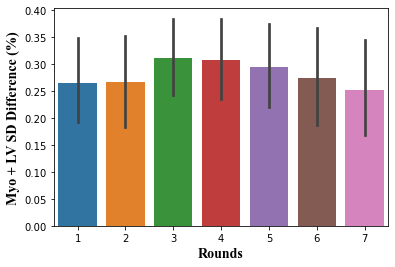

In [41]:
import seaborn as sns
df_Myo_desc = df_Myo_desc.set_axis(['Cases', '1', '2', '3', '4', '5', '6', '7'], axis='columns')
ax = sns.barplot(data=df_Myo_desc)
title_font_size = 14
ax.set_xlabel('Rounds', fontsize=title_font_size, fontweight='bold', fontname='Times New Roman')
ax.set_ylabel('Myo + LV SD Difference (%)', fontsize=title_font_size, fontweight='bold', fontname='Times New Roman')

In [42]:
df_ROI_MAE = pd.DataFrame()
df_ROI_MAE['Cases'] = df['Cases']
rounds = 7
for round in range(1, rounds+1):
    df_ROI_MAE[f'R{round}'] = df[f"R{round} ROI T1 MAE"]
df_ROI_MAE.describe()

,R1,R2,R3,R4,R5,R6,R7
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,15.951289,17.345917,18.013996,18.908944,19.733433,20.472253,21.369162
std,13.855908,13.389098,13.451543,13.217204,12.965912,12.699946,12.400580
min,3.462553,3.741082,3.614351,3.643173,3.724732,3.989457,4.242966
25%,5.175732,6.931974,7.430601,8.619301,9.467182,10.659741,11.998796
50%,10.130684,10.914715,11.256445,12.497875,13.752921,15.311508,17.526827
75%,27.335215,27.898913,28.177652,28.116470,28.197007,29.427487,29.736163
max,47.971395,47.155197,47.807225,47.739103,47.321786,47.326272,47.011589


In [43]:
df[['Raw ROI T1', 'R3 ROI T1']]

,Raw ROI T1,R3 ROI T1
0,1486.584593,1349.827557
1,1357.457246,1328.835193
2,1452.843230,1452.524905
3,1261.959705,1446.332854
4,1467.562622,1467.716351
5,1221.374051,1218.370869
6,1461.449777,1356.112949
7,287.951448,279.856133
8,1318.226429,1360.934749
9,1448.488596,1469.610488


In [44]:
df_Myo_MAE = pd.DataFrame()
df_Myo_MAE['Cases'] = df['Cases']
for round in range(1, rounds+1):
    df_Myo_MAE[f'R{round}'] = df[f"R{round} Myo T1 MAE"]
df_Myo_MAE.describe()

,R1,R2,R3,R4,R5,R6,R7
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,6.697765,7.509231,7.975257,8.446002,8.852104,9.205768,9.665854
std,5.161408,5.076821,5.237294,5.230421,5.178588,5.292735,5.311411
min,1.764215,2.591602,2.478704,2.521416,2.618511,2.855246,3.129758
25%,3.235517,3.924239,4.115708,4.654975,5.050110,5.237364,5.456437
50%,4.406297,5.571652,6.087097,6.630503,7.320891,8.057034,8.808021
75%,9.540719,10.099720,10.483883,10.560327,10.700676,11.358471,12.064523
max,21.249077,21.533638,22.001164,21.798891,21.933241,22.183821,22.641431


In [45]:
df_PCA_desc = pd.DataFrame()
df_PCA_desc['Cases'] = df_2['Cases']
for round  in range(1, 8):
    df_PCA_desc[f'R{round}/Raw PCA %'] = (df_2[f'R{round} PCA'] - df_2['Raw PCA']) / df_2['Raw PCA']
df_PCA_desc.describe()

,R1/Raw PCA %,R2/Raw PCA %,R3/Raw PCA %,R4/Raw PCA %,R5/Raw PCA %,R6/Raw PCA %,R7/Raw PCA %
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,-0.114484,-0.107759,-0.107759,-0.100039,-0.097226,-0.095186,-0.093040
std,0.069475,0.069114,0.069114,0.068505,0.068221,0.068109,0.068007
min,-0.241623,-0.236702,-0.236702,-0.228545,-0.225310,-0.222570,-0.219164
25%,-0.169833,-0.163840,-0.163840,-0.151328,-0.145997,-0.141774,-0.138685
50%,-0.129885,-0.123913,-0.123913,-0.115632,-0.112272,-0.110053,-0.107760
75%,-0.071697,-0.065664,-0.065664,-0.059790,-0.051677,-0.046669,-0.041026
max,0.023365,0.028200,0.028200,0.033623,0.034916,0.036494,0.037039


In [46]:
df_det = df_2[['R1 Det', 'R2 Det', 'R3 Det', 'R4 Det', 'R5 Det', 'R6 Det', 'R7 Det']]
df_det.describe()

,R1 Det,R2 Det,R3 Det,R4 Det,R5 Det,R6 Det,R7 Det
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.003506,0.003432,0.003432,0.004223,0.004384,0.004992,0.005295
std,0.000427,0.000308,0.000308,0.000292,0.000237,0.000267,0.000304
min,0.002860,0.002866,0.002866,0.003786,0.004008,0.004359,0.004721
25%,0.003174,0.003251,0.003251,0.004009,0.004179,0.004861,0.005136
50%,0.003422,0.003410,0.003410,0.004210,0.004385,0.005040,0.005303
75%,0.003839,0.003624,0.003624,0.004516,0.004554,0.005166,0.005519
max,0.004359,0.004073,0.004073,0.004753,0.004806,0.005429,0.005815
